<a href="https://colab.research.google.com/github/mlubega/cv/blob/master/OCR_Experiments.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [0]:
# Load the Drive helper and mount
from google.colab import drive

# This will prompt for authorization.
drive.mount('/content/drive')

Go to this URL in a browser: https://accounts.google.com/o/oauth2/auth?client_id=947318989803-6bn6qk8qdgf4n4g3pfee6491hc0brc4i.apps.googleusercontent.com&redirect_uri=urn%3Aietf%3Awg%3Aoauth%3A2.0%3Aoob&scope=email%20https%3A%2F%2Fwww.googleapis.com%2Fauth%2Fdocs.test%20https%3A%2F%2Fwww.googleapis.com%2Fauth%2Fdrive%20https%3A%2F%2Fwww.googleapis.com%2Fauth%2Fdrive.photos.readonly%20https%3A%2F%2Fwww.googleapis.com%2Fauth%2Fpeopleapi.readonly&response_type=code

Enter your authorization code:
··········
Mounted at /content/drive


In [0]:
#Enable CUDA GPU
!nvcc --version

nvcc: NVIDIA (R) Cuda compiler driver
Copyright (c) 2005-2018 NVIDIA Corporation
Built on Sat_Aug_25_21:08:01_CDT_2018
Cuda compilation tools, release 10.0, V10.0.130


In [0]:
!pip install opencv-python==3.4.2.16
!pip install opencv-contrib-python==3.4.2.16
!pip install matplotlib
!pip install numpy
!pip install pandas
!pip install Pillow

     |████████████████████████████████| 25.0MB 1.3MB/s 
ERROR: albumentations 0.1.12 has requirement imgaug<0.2.7,>=0.2.5, but you'll have imgaug 0.2.8 which is incompatible.
  Found existing installation: opencv-python 3.4.5.20
    Uninstalling opencv-python-3.4.5.20:
      Successfully uninstalled opencv-python-3.4.5.20
     |████████████████████████████████| 30.6MB 41.1MB/s 
  Found existing installation: opencv-contrib-python 3.4.3.18
    Uninstalling opencv-contrib-python-3.4.3.18:
      Successfully uninstalled opencv-contrib-python-3.4.3.18


In [0]:
#Navigate to Directory with Test Images
%cd /content/drive/My\ Drive/City\ Msc\ Data\ Science/ComputerVision/Coursework2019/images
!ls -l 

/content/drive/My Drive/City Msc Data Science/ComputerVision/Coursework2019/images
total 21607
-rw------- 1 root root 1341653 Apr 27 18:30 daniel.jpeg
-rw------- 1 root root 1029760 Apr 30 20:23 eijaz.jpg
-rw------- 1 root root 1408288 Apr 27 18:30 elia.jpeg
-rw------- 1 root root 2064149 Apr 30 20:22 elia_vid.mov
drwx------ 2 root root    4096 Apr 30 21:19 hide_folder
-rw------- 1 root root 1610413 Apr 18 22:49 jack.jpeg
-rw------- 1 root root 1603791 Apr 18 22:49 jack_side.jpeg
-rw------- 1 root root 6565079 Apr 30 20:18 juan_full.jpg
-rw------- 1 root root    6477 Apr 22 17:13 juan.jpg
-rw------- 1 root root 5081557 Apr 18 22:49 sepher.jpg
-rw------- 1 root root 1407219 Apr 18 22:49 sophie_side.jpeg


In [0]:
import cv2
import numpy as np
import os
import time
from google.colab.patches import cv2_imshow
from PIL import Image

605 454


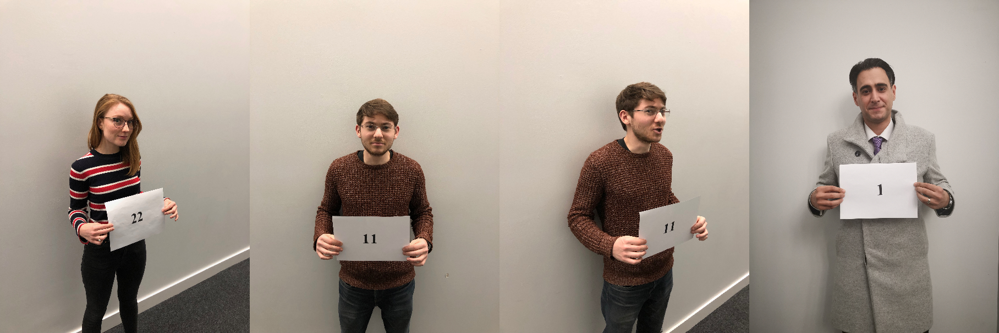

In [0]:
# Load Test Images
sophie = cv2.imread('sophie_side.jpeg')
jack = cv2.imread('jack.jpeg')
jack_side = cv2.imread('jack_side.jpeg')
sepher = cv2.imread('sepher.jpg')

soph = cv2.resize(sophie,None,fx=0.15,fy=0.15,interpolation=cv2.INTER_CUBIC)
jack1 = cv2.resize(jack,None,fx=0.15,fy=0.15,interpolation=cv2.INTER_CUBIC)
jack2 = cv2.resize(jack_side,None,fx=0.15,fy=0.15,interpolation=cv2.INTER_CUBIC)
h, w, c= jack2.shape
print(h, w) 
seph = cv2.resize(sepher,(w, h))

amigos = np.hstack((soph, jack1, jack2, seph))
cv2_imshow(amigos)

# HOG Experiments

/usr/local/lib/python3.6/dist-packages/skimage/feature/_hog.py:248: skimage_deprecation: Argument `visualise` is deprecated and will be changed to `visualize` in v0.16
  'be changed to `visualize` in v0.16', skimage_deprecation)


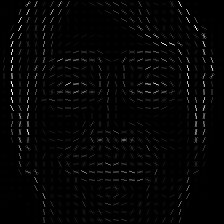

In [0]:
from skimage import data, exposure
from skimage.feature import hog

juan = cv2.imread('juan.jpg')

gray = cv2.cvtColor(juan, cv2.COLOR_BGR2GRAY)
logo = cv2.resize(gray, (224, 224))

(H, hogImage) = hog(logo, orientations=12, pixels_per_cell=(8, 8),
                             cells_per_block=(2, 2), transform_sqrt=True,
                             block_norm="L1", visualise=True)
hogImage = exposure.rescale_intensity(hogImage, out_range=(0, 255))
hogImage = hogImage.astype("uint8")

cv2_imshow(hogImage)


# Install and Import PyTessseract

In [0]:
!apt-get install libleptonica-dev
!apt-get install libtesseract-dev
!apt-get install tesseract-ocr
!pip install pytesseract
import pytesseract

Reading package lists... Done
Building dependency tree       
Reading state information... Done
The following package was automatically installed and is no longer required:
  libnvidia-common-410
Use 'apt autoremove' to remove it.
The following NEW packages will be installed:
  libleptonica-dev
0 upgraded, 1 newly installed, 0 to remove and 6 not upgraded.
Need to get 1,308 kB of archives.
After this operation, 5,966 kB of additional disk space will be used.
Get:1 http://archive.ubuntu.com/ubuntu bionic/universe amd64 libleptonica-dev amd64 1.75.3-3 [1,308 kB]
Fetched 1,308 kB in 1s (1,720 kB/s)
Selecting previously unselected package libleptonica-dev.
(Reading database ... 131304 files and directories currently installed.)
Preparing to unpack .../libleptonica-dev_1.75.3-3_amd64.deb ...
Unpacking libleptonica-dev (1.75.3-3) ...
Setting up libleptonica-dev (1.75.3-3) ...
Reading package lists... Done
Building dependency tree       
Reading state information... Done
The following package

# Simple Thresholding


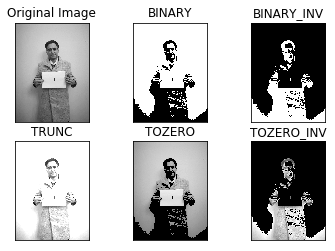

In [0]:
sp = seph.copy()
so = soph.copy()
jo = jack1.copy()



import cv2
import numpy as np
from matplotlib import pyplot as plt

img = cv2.cvtColor(sp, cv2.COLOR_BGR2GRAY)
ret,thresh1 = cv2.threshold(img,127,255,cv2.THRESH_BINARY)
ret,thresh2 = cv2.threshold(img,127,255,cv2.THRESH_BINARY_INV)
ret,thresh3 = cv2.threshold(img,127,255,cv2.THRESH_TRUNC)
ret,thresh4 = cv2.threshold(img,127,255,cv2.THRESH_TOZERO)
ret,thresh5 = cv2.threshold(img,127,255,cv2.THRESH_TOZERO_INV)

titles = ['Original Image','BINARY','BINARY_INV','TRUNC','TOZERO','TOZERO_INV']
images = [img, thresh1, thresh2, thresh3, thresh4, thresh5]

for i in range(6):
    plt.subplot(2,3,i+1),plt.imshow(images[i],'gray')
    plt.title(titles[i])
    plt.xticks([]),plt.yticks([])

plt.show()

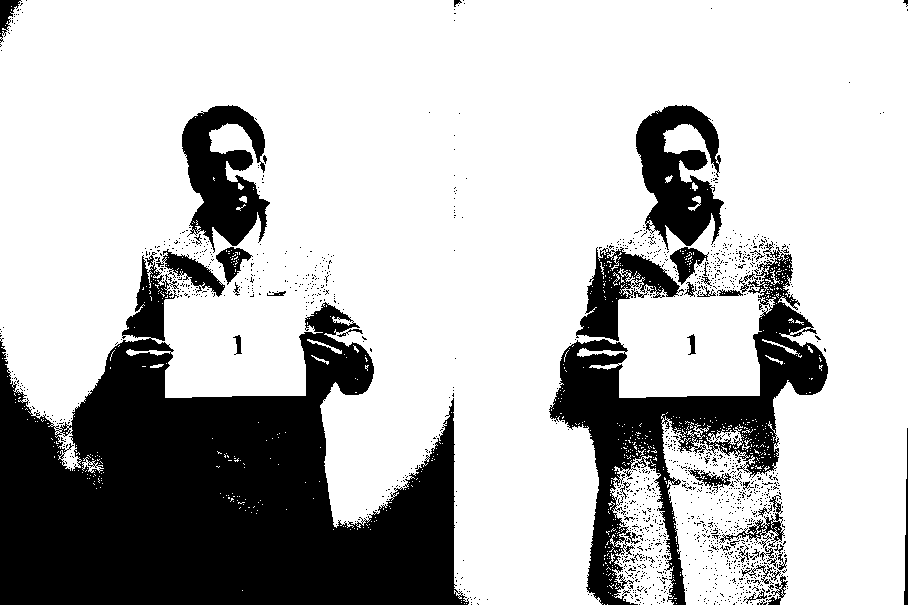

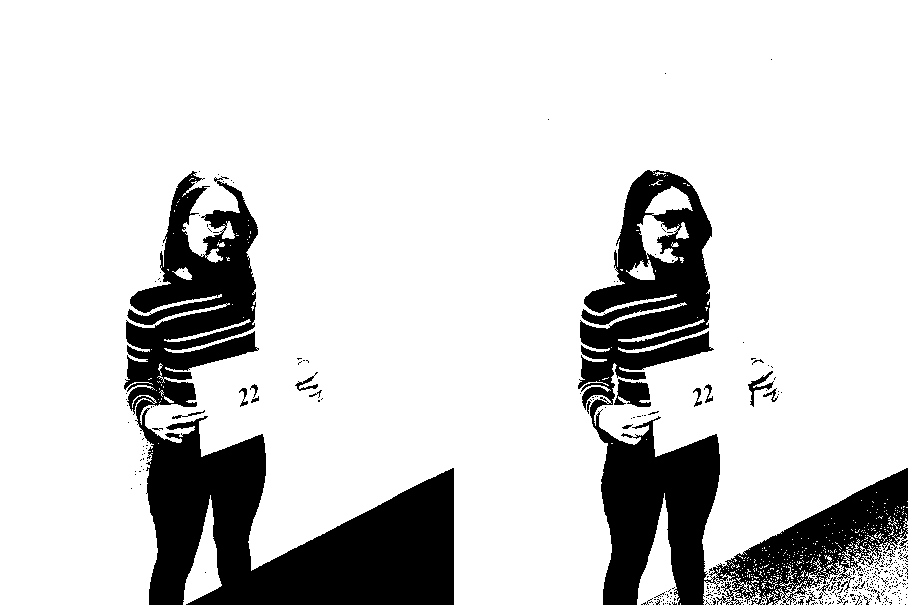

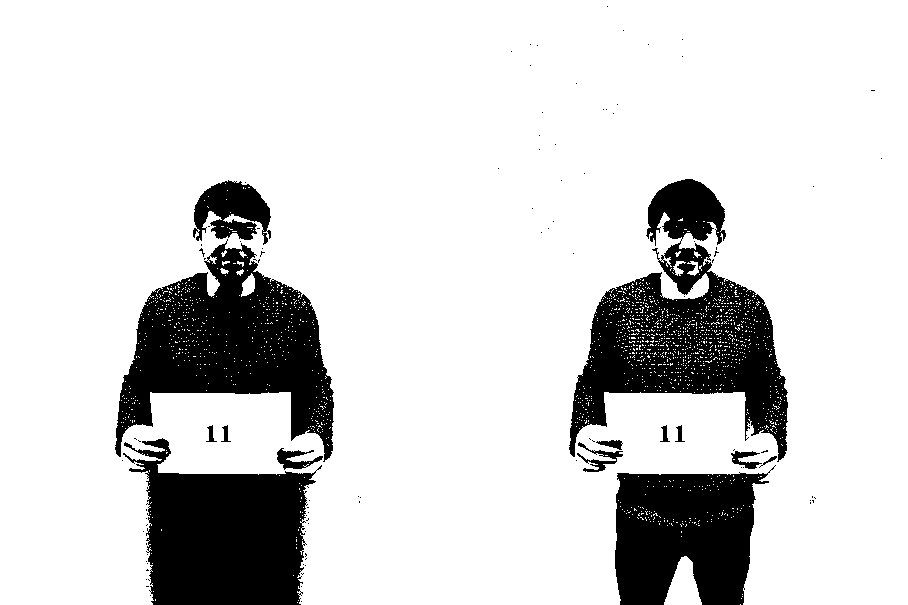

In [0]:
grayS1 = cv2.cvtColor(sp, cv2.COLOR_BGR2GRAY)
grayS2 = cv2.cvtColor(so, cv2.COLOR_BGR2GRAY)
grayS3 = cv2.cvtColor(jo, cv2.COLOR_BGR2GRAY)
retval, graythresh1 = cv2.threshold(grayS1, 200, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)
adaptthresh1 = cv2.adaptiveThreshold(grayS1, 255, cv2.ADAPTIVE_THRESH_GAUSSIAN_C, cv2.THRESH_BINARY, 301, 10)

retval, graythresh2 = cv2.threshold(grayS2, 200, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)
adaptthresh2 = cv2.adaptiveThreshold(grayS2, 255, cv2.ADAPTIVE_THRESH_GAUSSIAN_C, cv2.THRESH_BINARY, 301, 10)

retval, graythresh3 = cv2.threshold(grayS3, 200, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)
adaptthresh3 = cv2.adaptiveThreshold(grayS3, 255, cv2.ADAPTIVE_THRESH_GAUSSIAN_C, cv2.THRESH_BINARY, 301, 10)


thresh1  = np.hstack((graythresh1, adaptthresh1))
cv2_imshow(thresh1)

thresh2  = np.hstack((graythresh2, adaptthresh2))
cv2_imshow(thresh2)

thresh3 = np.hstack((graythresh3, adaptthresh3))
cv2_imshow(thresh3)

# Thresholding & Opening

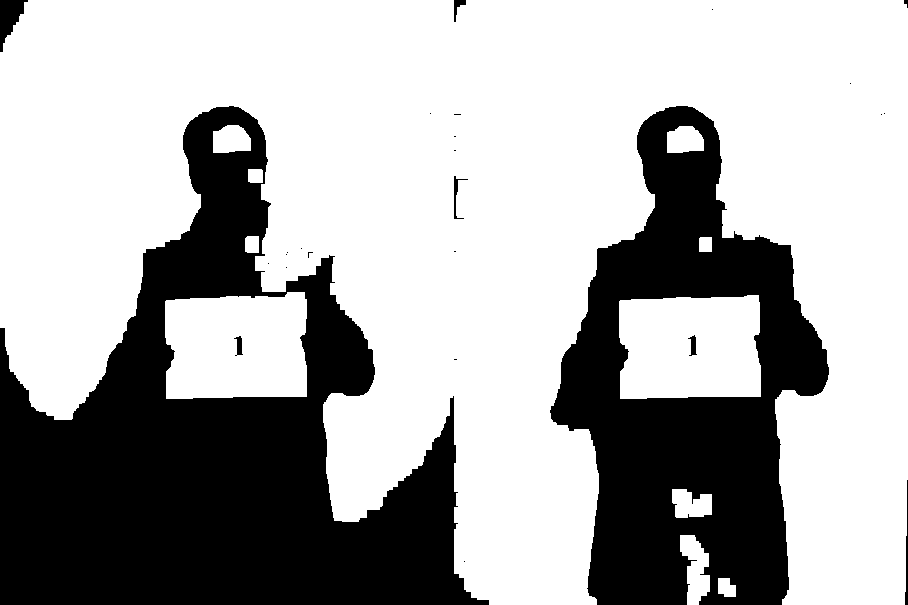

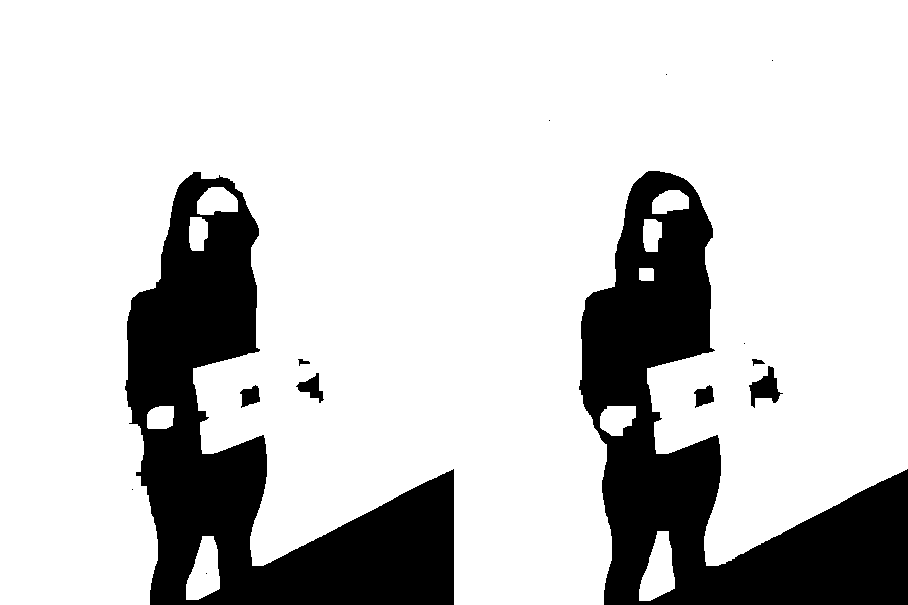

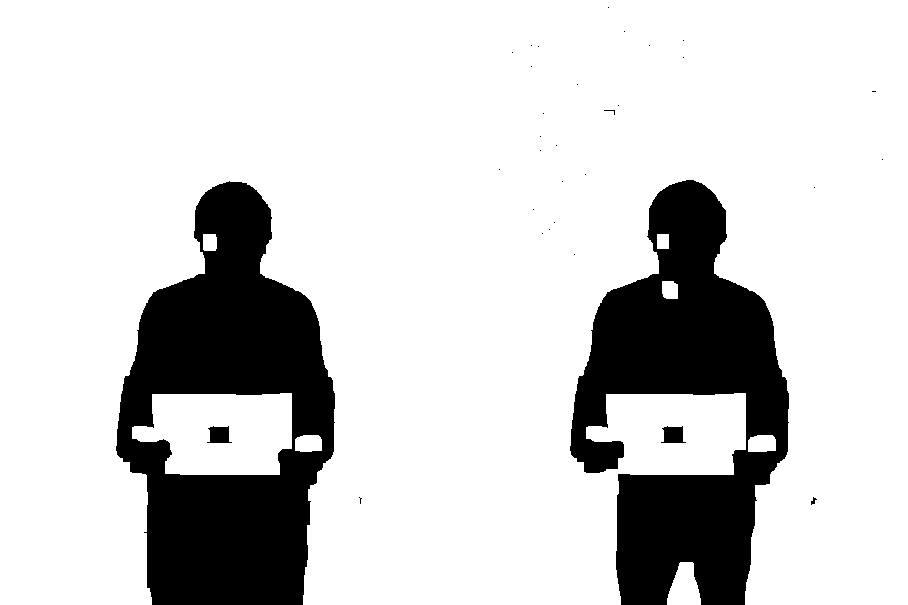

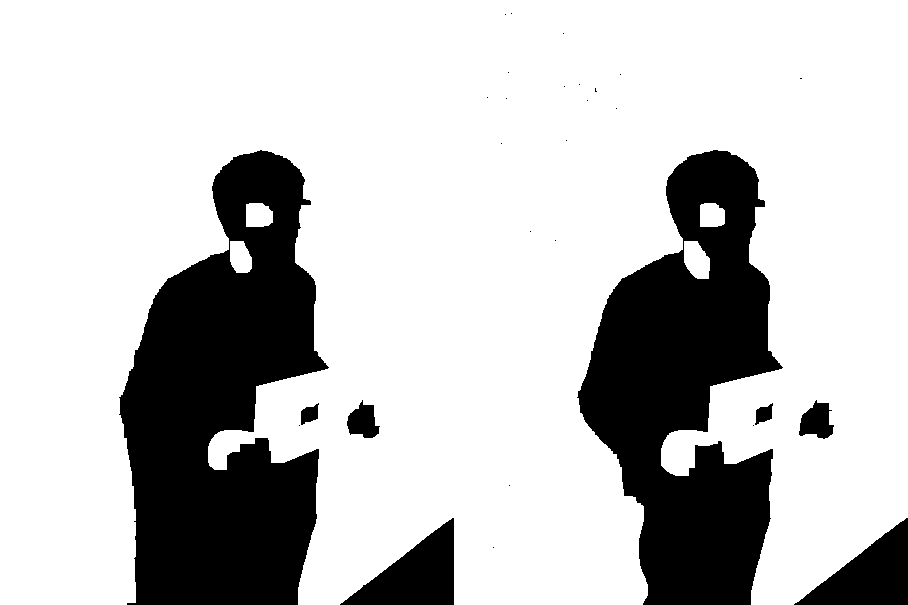

In [0]:
sp = seph.copy()
so = soph.copy()
jo = jack1.copy()
jo2 = jack2.copy()

kernel = np.ones((12,12),np.uint8)


grayS1 = cv2.cvtColor(sp, cv2.COLOR_BGR2GRAY)
grayS2 = cv2.cvtColor(so, cv2.COLOR_BGR2GRAY)
grayS3 = cv2.cvtColor(jo, cv2.COLOR_BGR2GRAY)
grayS4 = cv2.cvtColor(jo2, cv2.COLOR_BGR2GRAY)
retval, graythresh1 = cv2.threshold(grayS1, 200, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)
adaptthresh1 = cv2.adaptiveThreshold(grayS1, 255, cv2.ADAPTIVE_THRESH_GAUSSIAN_C, cv2.THRESH_BINARY, 301, 10)
opening1a = cv2.morphologyEx(graythresh1, cv2.MORPH_OPEN, kernel)
opening1b = cv2.morphologyEx(adaptthresh1, cv2.MORPH_OPEN, kernel)


retval, graythresh2 = cv2.threshold(grayS2, 200, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)
adaptthresh2 = cv2.adaptiveThreshold(grayS2, 255, cv2.ADAPTIVE_THRESH_GAUSSIAN_C, cv2.THRESH_BINARY, 301, 10)
opening2a = cv2.morphologyEx(graythresh2, cv2.MORPH_OPEN, kernel)
opening2b = cv2.morphologyEx(adaptthresh2, cv2.MORPH_OPEN, kernel)

retval, graythresh3 = cv2.threshold(grayS3, 200, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)
adaptthresh3 = cv2.adaptiveThreshold(grayS3, 255, cv2.ADAPTIVE_THRESH_GAUSSIAN_C, cv2.THRESH_BINARY, 301, 10)
opening3a = cv2.morphologyEx(graythresh3, cv2.MORPH_OPEN, kernel)
opening3b = cv2.morphologyEx(adaptthresh3, cv2.MORPH_OPEN, kernel)

retval, graythresh4 = cv2.threshold(grayS4, 200, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)
adaptthresh4 = cv2.adaptiveThreshold(grayS4, 255, cv2.ADAPTIVE_THRESH_GAUSSIAN_C, cv2.THRESH_BINARY, 301, 10)
opening4a = cv2.morphologyEx(graythresh4, cv2.MORPH_OPEN, kernel)
opening4b = cv2.morphologyEx(adaptthresh4, cv2.MORPH_OPEN, kernel)


thresh1  = np.hstack((opening1a, opening1b))
cv2_imshow(thresh1)

thresh2  = np.hstack((opening2a, opening2b))
cv2_imshow(thresh2)

thresh3 = np.hstack((opening3a, opening3b))
cv2_imshow(thresh3)

thresh4 = np.hstack((opening4a, opening4b))
cv2_imshow(thresh4)

# ----  Apply SURF to Opening

12000.0
1


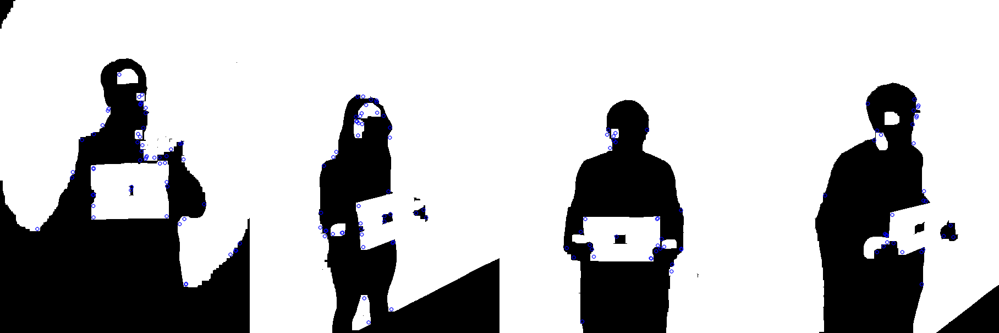

In [0]:
surf = cv2.xfeatures2d.SURF_create(hessianThreshold=12000, nOctaves=1, nOctaveLayers=3) #what threshold?
surf.setExtended(True)

print(surf.getHessianThreshold())
print(surf.getNOctaves() )

def getSURFFeatures(img):
    #gray_img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    kp, desc = surf.detectAndCompute(img, None)
    return kp, desc
  
  
  
  
v1 = opening1a.copy()
kp1, desc1 = getSURFFeatures(v1)
img1 = cv2.drawKeypoints(v1,kp1,None,(255,0,0),2)

v2 = opening2a.copy()
kp2, desc2 = getSURFFeatures(v2)
img2 = cv2.drawKeypoints(v2,kp2,None,(255,0,0),2)

    
v3 = opening3a.copy()
kp3, desc3 = getSURFFeatures(v3)
img3 = cv2.drawKeypoints(v3,kp3,None,(255,0,0),2)
    
v4 = opening4a.copy()
kp4, desc4 = getSURFFeatures(v4)
img4 = cv2.drawKeypoints(v4,kp4,None,(255,0,0),2)

  

group = np.hstack((img1, img2, img3, img4))

cv2_imshow(group)

# --- Apply MSER to Opening

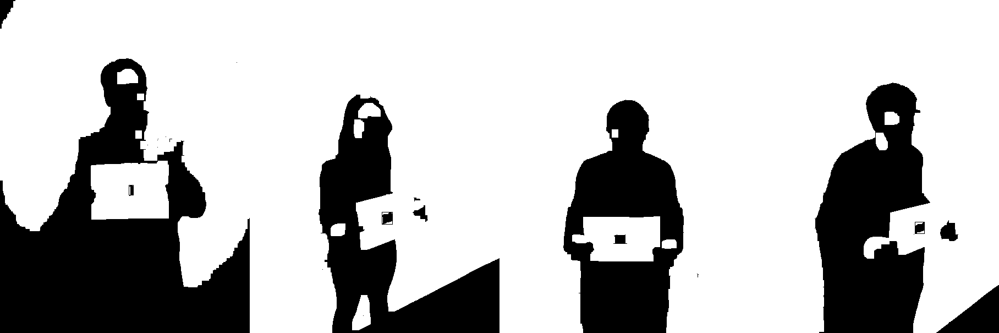

In [0]:



vis1 = opening1a.copy()
mser = cv2.MSER_create(_delta=10, _max_area=300, _max_variation=0.1)
#gray1 = cv2.cvtColor(vis1, cv2.COLOR_BGR2GRAY)
regions, _ = mser.detectRegions(vis1)
for p in regions:
    xmax, ymax = np.amax(p, axis=0)
    xmin, ymin = np.amin(p, axis=0)
    cv2.rectangle(vis1, (xmin,ymax), (xmax,ymin), (0, 255, 0), 1)
      
      
vis2 = opening2a.copy()
#mser = cv2.MSER_create()
#gray2 = cv2.cvtColor(vis2, cv2.COLOR_BGR2GRAY)
regions, _ = mser.detectRegions(vis2)
for p in regions:
    xmax, ymax = np.amax(p, axis=0)
    xmin, ymin = np.amin(p, axis=0)
    cv2.rectangle(vis2, (xmin,ymax), (xmax,ymin), (0, 255, 0), 1)
    
vis3 = opening3a.copy()
#mser = cv2.MSER_create(
#gray3 = cv2.cvtColor(vis3, cv2.COLOR_BGR2GRAY)
regions, _ = mser.detectRegions(vis3)
for p in regions:
    xmax, ymax = np.amax(p, axis=0)
    xmin, ymin = np.amin(p, axis=0)
    cv2.rectangle(vis3, (xmin,ymax), (xmax,ymin), (0, 255, 0), 1)
    
    
vis4 = opening4a.copy()
#mser = cv2.MSER_create()
#gray4 = cv2.cvtColor(vis4, cv2.COLOR_BGR2GRAY)
regions, _ = mser.detectRegions(vis4)
for p in regions:
    xmax, ymax = np.amax(p, axis=0)
    xmin, ymin = np.amin(p, axis=0)
    cv2.rectangle(vis4, (xmin,ymax), (xmax,ymin), (0, 255, 0), 1)
  

group = np.hstack((vis1, vis2, vis3, vis4))

cv2_imshow(group)

## MSER on RGB Images (for better contrast)

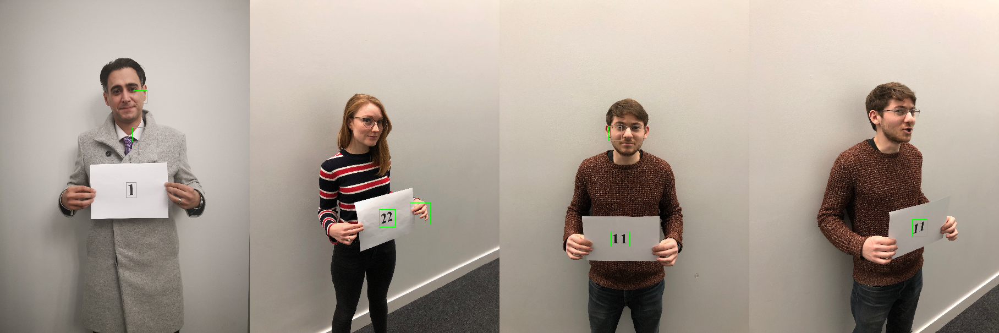

In [0]:
i1 = seph.copy()
i2 = soph.copy()
i3 = jack1.copy()
i4 = jack2.copy()


vis1 = opening1a.copy()
mser = cv2.MSER_create(_delta=10, _max_area=400, _max_variation=0.1)
#gray1 = cv2.cvtColor(vis1, cv2.COLOR_BGR2GRAY)
regions, _ = mser.detectRegions(vis1)
for p in regions:
    xmax, ymax = np.amax(p, axis=0)
    xmin, ymin = np.amin(p, axis=0)
    cv2.rectangle(i1, (xmin-5,ymax + 5), (xmax+5,ymin - 5), (0, 255, 0), 1)
      
      
vis2 = opening2a.copy()
#mser = cv2.MSER_create()
#gray2 = cv2.cvtColor(vis2, cv2.COLOR_BGR2GRAY)
regions, _ = mser.detectRegions(vis2)
for p in regions:
    xmax, ymax = np.amax(p, axis=0)
    xmin, ymin = np.amin(p, axis=0)
    cv2.rectangle(i2, (xmin-5,ymax + 5), (xmax+5,ymin - 5), (0, 255, 0), 1)
    
vis3 = opening3a.copy()
#mser = cv2.MSER_create(
#gray3 = cv2.cvtColor(vis3, cv2.COLOR_BGR2GRAY)
regions, _ = mser.detectRegions(vis3)
for p in regions:
    xmax, ymax = np.amax(p, axis=0)
    xmin, ymin = np.amin(p, axis=0)
    cv2.rectangle(i3, (xmin-5,ymax + 5), (xmax+5,ymin - 5), (0, 255, 0), 1)
    
    
vis4 = opening4a.copy()
#mser = cv2.MSER_create()
#gray4 = cv2.cvtColor(vis4, cv2.COLOR_BGR2GRAY)
regions, _ = mser.detectRegions(vis4)
for p in regions:
    xmax, ymax = np.amax(p, axis=0)
    xmin, ymin = np.amin(p, axis=0)
    cv2.rectangle(i4, (xmin-5,ymax + 5), (xmax+5,ymin - 5), (0, 255, 0), 1)
  

group = np.hstack((i1, i2, i3, i4))

cv2_imshow(group)

# --- Histograms on Grayscale MSER Regions from Opening

[  4  64   8   2   2   0   4   1   3   4   0   5   2   3 163 239]
0.9543650793650794


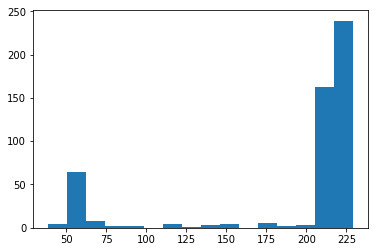

[ 23  15  13   5   3   4  32  38  12  26  50  62  51  49  74 141]
0.5267558528428093


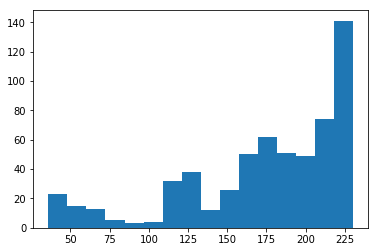

[  5   2  10   8  16  20  22  23  30  95 169  71  32   2   3  44]
0.11956521739130435


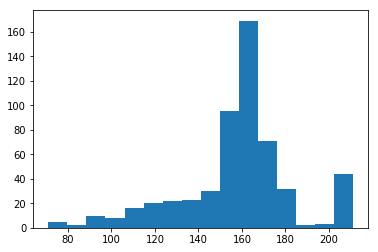

In [0]:
import matplotlib.pyplot as plt

i1 = seph.copy()

vis1 = opening1a.copy()
mser = cv2.MSER_create(_delta=10, _max_area=500, _max_variation=0.1)
#gray1 = cv2.cvtColor(vis1, cv2.COLOR_BGR2GRAY)

rois = []
regions, _ = mser.detectRegions(vis1)
for p in regions:
    xmax, ymax = np.amax(p, axis=0)
    xmin, ymin = np.amin(p, axis=0)
    xmax, ymax = xmax + 5, ymax + 5
    xmin, ymin = xmin - 5, ymin - 5
    gray  = cv2.cvtColor(i1[ymin:ymax, xmin:xmax], cv2.COLOR_BGR2GRAY)
    rois.append(gray)


for img in rois:
  cv2_imshow(img)
  hist,bins = np.histogram(img.ravel(),16)
  print(hist)

  low = sum(hist[:3])
  high = sum(hist[13:])
  al = sum(hist)

  print((low+high)/al)


  plt.hist(img.ravel(),16)
  plt.show()
  



In [0]:
one = rois[0]
config = ("-l eng --oem 3 --psm 6")
text = pytesseract.image_to_string(one, config=config) 
print(text)

1


In [0]:
gray = cv2.bitwise_not(one)

# threshold the image, setting all foreground pixels to
# 255 and all background pixels to 0
thresh = cv2.threshold(gray, 0, 255,
	cv2.THRESH_BINARY | cv2.THRESH_OTSU)[1]

#cv2_imshow(thresh)

# grab the (x, y) coordinates of all pixel values that
# are greater than zero, then use these coordinates to
# compute a rotated bounding box that contains all
# coordinates
coords = np.column_stack(np.where(thresh > 0))
angle = cv2.minAreaRect(coords)[-1]
print(angle)
 
# the `cv2.minAreaRect` function returns values in the
# range [-90, 0); as the rectangle rotates clockwise the
# returned angle trends to 0 -- in this special case we
# need to add 90 degrees to the angle
if angle < -45:
	angle = -(90 + angle)
 
# # otherwise, just take the inverse of the angle to make
# # it positive
else:
	angle = -angle
  
print(angle)


# rotate the image to deskew it
image = one.copy()
(h, w) = image.shape[:2]
center = (w // 2, h // 2)
M = cv2.getRotationMatrix2D(center, angle, 1.0)
rotated = cv2.warpAffine(image, M, (w, h),
	flags=cv2.INTER_CUBIC, borderMode=cv2.BORDER_REPLICATE)


cv2_imshow(image)
cv2_imshow(rotated)

-86.18592071533203
-3.8140792846679688


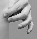

[  6   3  17  16  17  29  50  43  40 130 578  60  96 157 147  54]
0.3437283437283437


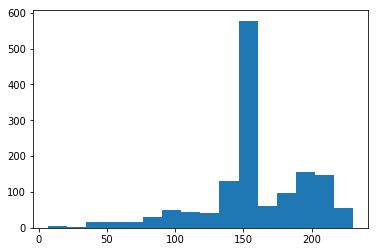

[  6  35  78   5   3   4   2   1   1   4   2   4  97 294 290 102]
0.9773706896551724


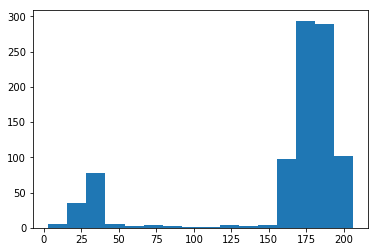

In [0]:
import matplotlib.pyplot as plt

i2 = soph.copy()

vis2 = opening2a.copy()
mser = cv2.MSER_create(_delta=10, _max_area=500, _max_variation=0.1)
#gray1 = cv2.cvtColor(vis1, cv2.COLOR_BGR2GRAY)

rois = []
regions, _ = mser.detectRegions(vis2)
for p in regions:
    xmax, ymax = np.amax(p, axis=0)
    xmin, ymin = np.amin(p, axis=0)
    xmax, ymax = xmax + 5, ymax + 5
    xmin, ymin = xmin - 5, ymin - 5
    gray  = cv2.cvtColor(i2[ymin:ymax, xmin:xmax], cv2.COLOR_BGR2GRAY)
    rois.append(gray)
      
      
for img in rois:
  cv2_imshow(img)
  hist,bins = np.histogram(img.ravel(),16)
  print(hist)
  low = sum(hist[:4])
  high = sum(hist[12:])
  al = sum(hist)
  
  print((low+high)/al)
  
  plt.hist(img.ravel(),16)
  plt.show()
    


In [0]:
twentytwo = rois[1]
config = ("-l eng --oem 3 --psm 6")
text = pytesseract.image_to_string(twentytwo, config=config) 
print(text)

21


In [0]:
gray = cv2.bitwise_not(twentytwo)

# threshold the image, setting all foreground pixels to
# 255 and all background pixels to 0
thresh = cv2.threshold(gray, 0, 255,
	cv2.THRESH_BINARY | cv2.THRESH_OTSU)[1]

cv2_imshow(thresh)

# grab the (x, y) coordinates of all pixel values that
# are greater than zero, then use these coordinates to
# compute a rotated bounding box that contains all
# coordinates
coords = np.column_stack(np.where(thresh > 0))
angle = cv2.minAreaRect(coords)[-1]
print(angle)
 
# the `cv2.minAreaRect` function returns values in the
# range [-90, 0); as the rectangle rotates clockwise the
# returned angle trends to 0 -- in this special case we
# need to add 90 degrees to the angle
if angle < -45:
	angle = -(90 + angle)
 
# # otherwise, just take the inverse of the angle to make
# # it positive
else:
	angle = -angle
  
print(angle)


# rotate the image to deskew it
image = twentytwo.copy()
(h, w) = image.shape[:2]
center = (w // 2, h // 2)
M = cv2.getRotationMatrix2D(center, angle, 1.0)
rotated = cv2.warpAffine(image, M, (w, h),
	flags=cv2.INTER_CUBIC, borderMode=cv2.BORDER_REPLICATE)


cv2_imshow(image)
cv2_imshow(rotated)

-73.3007583618164
-16.699241638183594


In [0]:

config = ("-l eng --oem 3 --psm 13 --outputbase digits")
text = pytesseract.image_to_string(rotated, config=config) 
print(text)

2,


In [0]:
pytesseract --version

NameError: ignored

[ 18  64  55   1   4   6   2   0   2   0   0   2   4 308 407  11]
0.9819004524886877


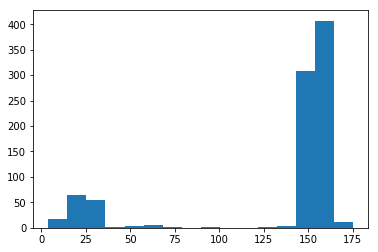

[ 16  24  39  30  28  39  80  50  49  32  46  43  72  90 233  65]
0.6079059829059829


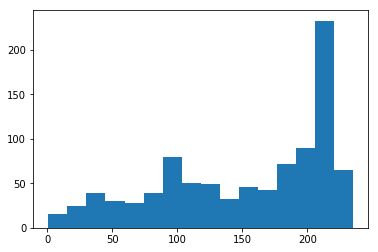

[  3   8   3   4  11  50  50  44  43  43  54  53  94 115  16   7]
0.4180602006688963


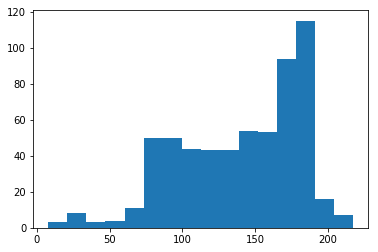

In [0]:
import matplotlib.pyplot as plt

i3 = jack1.copy()

vis3 = opening3a.copy()
mser = cv2.MSER_create(_delta=10, _max_area=500, _max_variation=0.1)
#gray1 = cv2.cvtColor(vis1, cv2.COLOR_BGR2GRAY)

rois = []
regions, _ = mser.detectRegions(vis3)
for p in regions:
    xmax, ymax = np.amax(p, axis=0)
    xmin, ymin = np.amin(p, axis=0)
    xmax, ymax = xmax + 5, ymax + 5
    xmin, ymin = xmin - 5, ymin - 5
    gray  = cv2.cvtColor(i3[ymin:ymax, xmin:xmax], cv2.COLOR_BGR2GRAY)
    rois.append(gray)
      
      
for img in rois:
  cv2_imshow(img)
  hist,bins = np.histogram(img.ravel(),16)
  print(hist)
  low = sum(hist[:4])
  high = sum(hist[12:])
  al = sum(hist)
  
  print((low+high)/al)
  
  plt.hist(img.ravel(),16)
  plt.show()
   

In [0]:
eleven = rois[0]
config = ("-l eng --oem 3 --psm 6")
text = pytesseract.image_to_string(eleven, config=config) 
print(text)

11


0.974910394265233


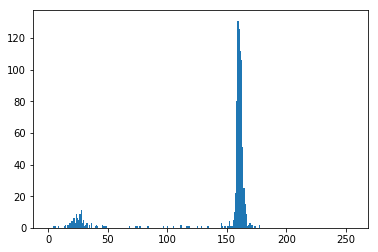

In [0]:
import matplotlib.pyplot as plt

i4 = jack2.copy()

vis4 = opening4a.copy()
mser = cv2.MSER_create(_delta=10, _max_area=500, _max_variation=0.1)
#gray1 = cv2.cvtColor(vis1, cv2.COLOR_BGR2GRAY)

rois = []
regions, _ = mser.detectRegions(vis4)
for p in regions:
    xmax, ymax = np.amax(p, axis=0)
    xmin, ymin = np.amin(p, axis=0)
    xmax, ymax = xmax + 5, ymax + 5
    xmin, ymin = xmin - 5, ymin - 5
    gray  = cv2.cvtColor(i4[ymin:ymax, xmin:xmax], cv2.COLOR_BGR2GRAY)
    rois.append(gray)
      
      
for img in rois:
  cv2_imshow(img)
  hist,bins = np.histogram(img.ravel(),256,[0,256])
  low = sum(hist[:75])
  high = sum(hist[150:])
  al = sum(hist)
  
  print((low+high)/al)
  
  plt.hist(img.ravel(),256,[0,256])
  plt.show()

In [0]:
!tesseract --version

tesseract 4.0.0-beta.1
 leptonica-1.75.3
  libgif 5.1.4 : libjpeg 8d (libjpeg-turbo 1.5.2) : libpng 1.6.34 : libtiff 4.0.9 : zlib 1.2.11 : libwebp 0.6.1 : libopenjp2 2.3.0

 Found AVX2
 Found AVX
 Found SSE


In [0]:
import pytesseract

eleven = rois[0]
config = ("-l eng --oem 3 --psm 13 digits -c tessedit_char_whitelist=0123456789")
text = pytesseract.image_to_string(eleven, config=config) 
print(text)

a


In [0]:
gray = cv2.bitwise_not(eleven)

# threshold the image, setting all foreground pixels to
# 255 and all background pixels to 0
thresh = cv2.threshold(gray, 0, 255,
	cv2.THRESH_BINARY | cv2.THRESH_OTSU)[1]

cv2_imshow(thresh)

# grab the (x, y) coordinates of all pixel values that
# are greater than zero, then use these coordinates to
# compute a rotated bounding box that contains all
# coordinates
coords = np.column_stack(np.where(thresh > 0))
angle = cv2.minAreaRect(coords)[-1]
print(angle)
 
# the `cv2.minAreaRect` function returns values in the
# range [-90, 0); as the rectangle rotates clockwise the
# returned angle trends to 0 -- in this special case we
# need to add 90 degrees to the angle
if angle < -45:
	angle = -(90 + angle)
 
# # otherwise, just take the inverse of the angle to make
# # it positive
else:
	angle = -angle
  
print(angle)


# rotate the image to deskew it
image = eleven.copy()
(h, w) = image.shape[:2]
center = (w // 2, h // 2)
M = cv2.getRotationMatrix2D(center, angle, 1.0)
rotated = cv2.warpAffine(image, M, (w, h),
	flags=cv2.INTER_CUBIC, borderMode=cv2.BORDER_REPLICATE)


cv2_imshow(image)
cv2_imshow(rotated)

-69.44395446777344
-20.556045532226562


In [0]:
config = ("-l eng --oem 3 --psm 13")
text = pytesseract.image_to_string(rotated, config=config) 
print(text)

i


# Background Substraction


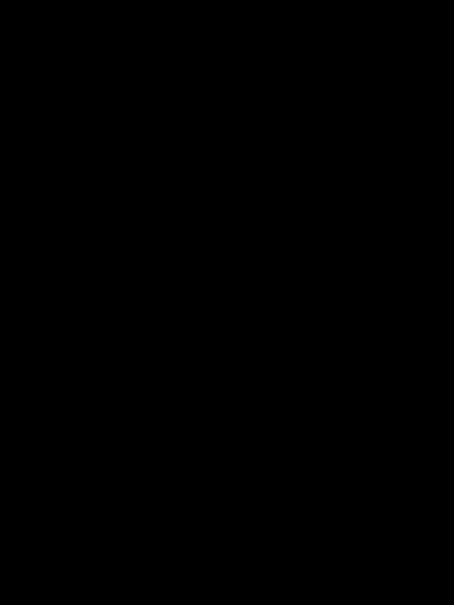

In [0]:
i1 = seph.copy()
i2 = soph.copy()
i3 = jack1.copy()
i4 = jack2.copy()

kernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE,(3,3))
fgbg = cv2.bgsegm.createBackgroundSubtractorGMG()

fgmask = fgbg.apply(i1)
fgmask = cv2.morphologyEx(fgmask, cv2.MORPH_OPEN, kernel)

cv2_imshow(fgmask)

# Color Thresholding & Coutours

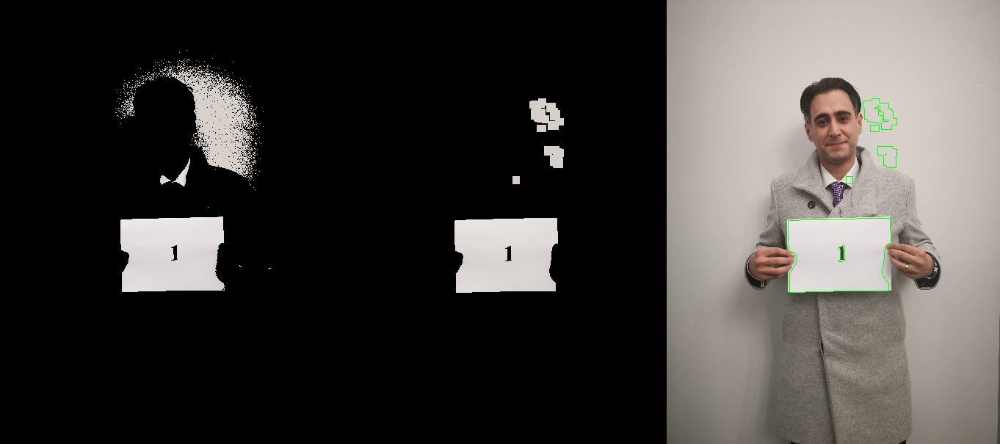

In [0]:
img = seph.copy()

#color thresholding
lower = np.array([200,200,200])
upper = np.array([255,255,255])

mask = cv2.inRange(img, lower, upper)
res = cv2.bitwise_and(img,img, mask= mask)


#opening to remove noise
kernel = np.ones((10,10),np.uint8)
opening = cv2.morphologyEx(res, cv2.MORPH_OPEN, kernel)

gray = cv2.cvtColor(opening, cv2.COLOR_RGB2GRAY)
im2, contours, hierarchy= cv2.findContours(gray, cv2.RETR_TREE, cv2.CHAIN_APPROX_SIMPLE)
c_img = cv2.drawContours(img, contours, -1, (0,255,0), 1)

#print(res.shape)
#print(opening.shape)
#print(c_img.shape)

thresh = np.hstack((res, opening, c_img))
cv2_imshow(thresh)

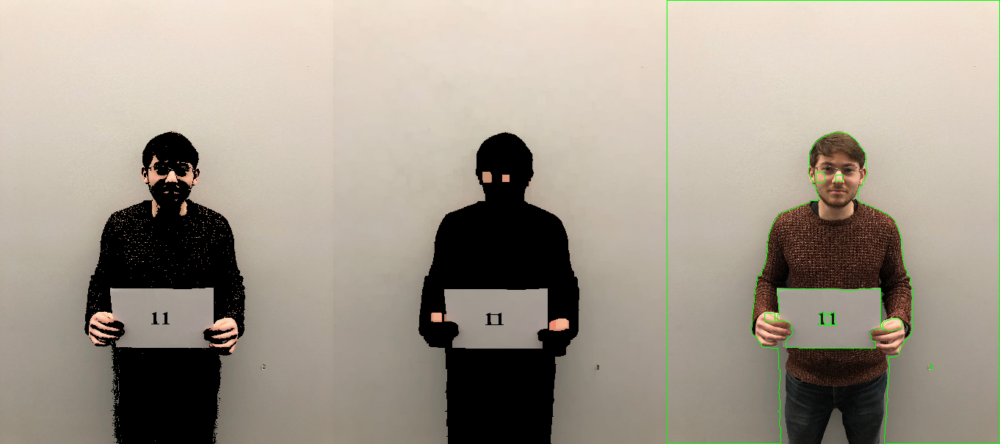

In [0]:
img = jack1.copy()

#color thresholding
lower = np.array([100,100,100])
upper = np.array([255,255,255])

mask = cv2.inRange(img, lower, upper)
res = cv2.bitwise_and(img,img, mask= mask)


#opening to remove noise
kernel = np.ones((10,10),np.uint8)
opening = cv2.morphologyEx(res, cv2.MORPH_OPEN, kernel)

gray = cv2.cvtColor(opening, cv2.COLOR_RGB2GRAY)
im2, contours, hierarchy= cv2.findContours(gray, cv2.RETR_TREE, cv2.CHAIN_APPROX_SIMPLE)
c_img = cv2.drawContours(img, contours, -1, (0,255,0), 1)

#print(res.shape)
#print(opening.shape)
#print(c_img.shape)

thresh = np.hstack((res, opening, c_img))
cv2_imshow(thresh)

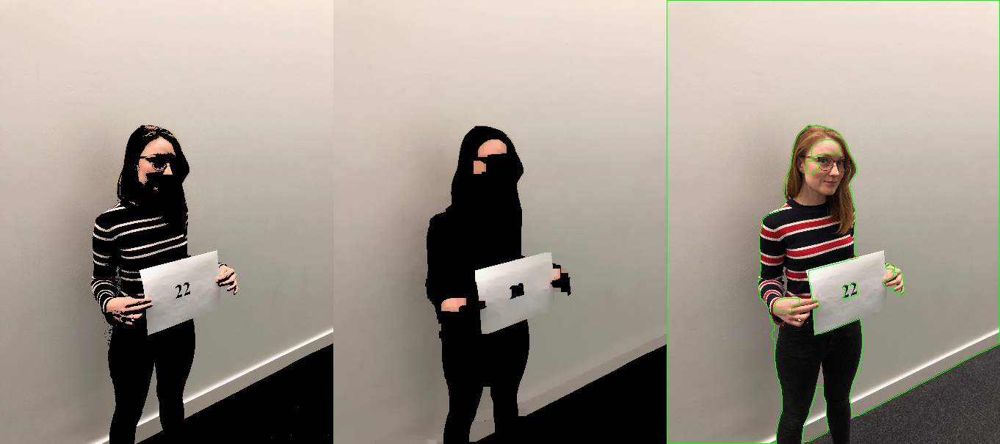

In [0]:
img = soph.copy()

#color thresholding
lower = np.array([100,100,100])
upper = np.array([255,255,255])

mask = cv2.inRange(img, lower, upper)
res = cv2.bitwise_and(img,img, mask= mask)


#opening to remove noise
kernel = np.ones((10,10),np.uint8)
opening = cv2.morphologyEx(res, cv2.MORPH_OPEN, kernel)

gray = cv2.cvtColor(opening, cv2.COLOR_RGB2GRAY)
im2, contours, hierarchy= cv2.findContours(gray, cv2.RETR_TREE, cv2.CHAIN_APPROX_SIMPLE)
c_img = cv2.drawContours(img, contours, -1, (0,255,0), 1)

#print(res.shape)
#print(opening.shape)
#print(c_img.shape)

thresh = np.hstack((res, opening, c_img))
cv2_imshow(thresh)

# SURF Features

700.0
2


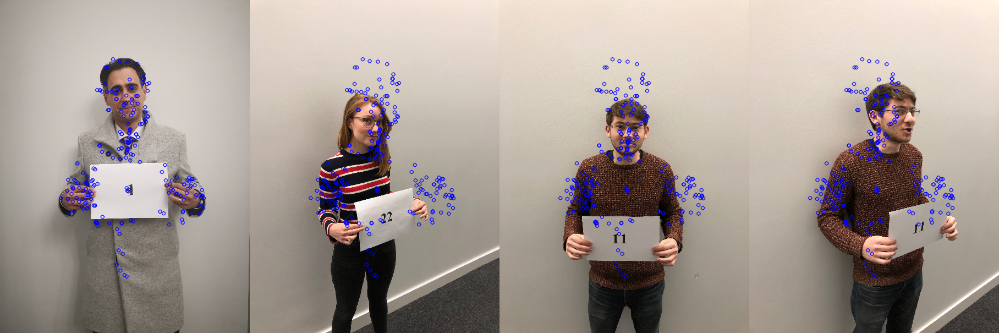

In [0]:
surf = cv2.xfeatures2d.SURF_create(hessianThreshold=700, nOctaves=2, nOctaveLayers=3) #what threshold?
surf.setExtended(True)

print(surf.getHessianThreshold())
print(surf.getNOctaves() )

def getSURFFeatures(img):
    gray_img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    kp, desc = surf.detectAndCompute(gray_img, None)
    return kp, desc
  
  
  
  
v1 = seph.copy()
kp1, desc1 = getSURFFeatures(v1)
img1 = cv2.drawKeypoints(v1,kp1,None,(255,0,0),2)

v2 = soph.copy()
kp2, desc2 = getSURFFeatures(v2)
img2 = cv2.drawKeypoints(v2,kp1,None,(255,0,0),2)

    
v3 = jack1.copy()
kp3, desc3 = getSURFFeatures(v3)
img3 = cv2.drawKeypoints(v3,kp1,None,(255,0,0),2)
    
v4 = jack2.copy()
kp4, desc4 = getSURFFeatures(v4)
img4 = cv2.drawKeypoints(v4,kp1,None,(255,0,0),2)

  

group = np.hstack((img1, img2, img3, img4))

cv2_imshow(group)

# MSER


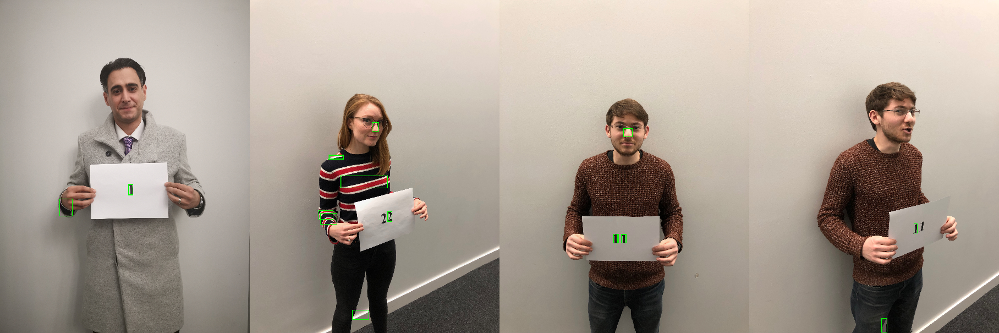

In [0]:
vis1 = seph.copy()
mser = cv2.MSER_create(_delta=10, _max_area=500, _max_variation=0.1)
gray1 = cv2.cvtColor(vis1, cv2.COLOR_BGR2GRAY)
regions, _ = mser.detectRegions(gray1)
for p in regions:
    xmax, ymax = np.amax(p, axis=0)
    xmin, ymin = np.amin(p, axis=0)
    cv2.rectangle(vis1, (xmin,ymax), (xmax,ymin), (0, 255, 0), 1)
      
      
vis2 = soph.copy()
#mser = cv2.MSER_create()
gray2 = cv2.cvtColor(vis2, cv2.COLOR_BGR2GRAY)
regions, _ = mser.detectRegions(gray2)
for p in regions:
    xmax, ymax = np.amax(p, axis=0)
    xmin, ymin = np.amin(p, axis=0)
    cv2.rectangle(vis2, (xmin,ymax), (xmax,ymin), (0, 255, 0), 1)
    
vis3 = jack1.copy()
#mser = cv2.MSER_create()
gray3 = cv2.cvtColor(vis3, cv2.COLOR_BGR2GRAY)
regions, _ = mser.detectRegions(gray3)
for p in regions:
    xmax, ymax = np.amax(p, axis=0)
    xmin, ymin = np.amin(p, axis=0)
    cv2.rectangle(vis3, (xmin,ymax), (xmax,ymin), (0, 255, 0), 1)
    
    
vis4 = jack2.copy()
#mser = cv2.MSER_create()
gray4 = cv2.cvtColor(vis4, cv2.COLOR_BGR2GRAY)
regions, _ = mser.detectRegions(gray4)
for p in regions:
    xmax, ymax = np.amax(p, axis=0)
    xmin, ymin = np.amin(p, axis=0)
    cv2.rectangle(vis4, (xmin,ymax), (xmax,ymin), (0, 255, 0), 1)
  

group = np.hstack((vis1, vis2, vis3, vis4))

cv2_imshow(group)

# Canny Edges

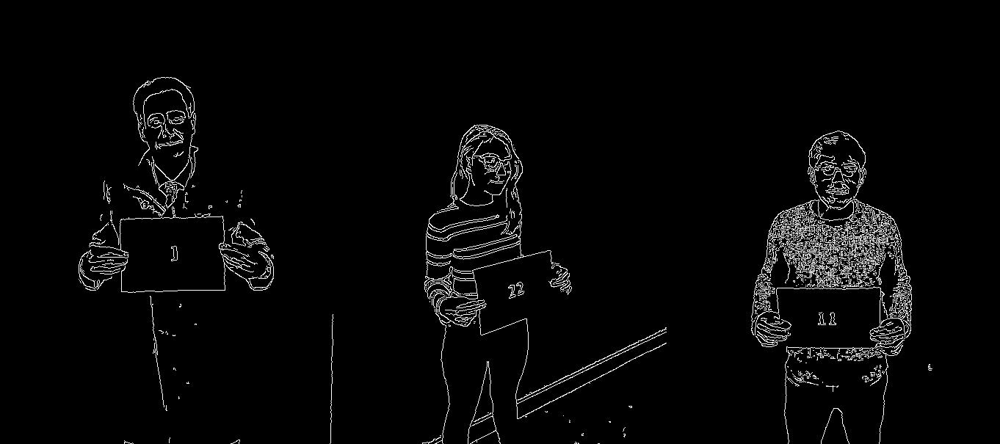

In [0]:
vis1 = seph.copy()
gray1 = cv2.cvtColor(vis1, cv2.COLOR_BGR2GRAY)
edges1 = cv2.Canny(gray,100,200)


vis2 = soph.copy()
gray2 = cv2.cvtColor(vis2, cv2.COLOR_BGR2GRAY)
edges2 = cv2.Canny(gray2,100,200)

vis3 = jack1.copy()
gray3 = cv2.cvtColor(vis3, cv2.COLOR_BGR2GRAY)
edges3 = cv2.Canny(gray3,100,200)

edges = np.hstack((edges1, edges2, edges3))

cv2_imshow(edges)
    

# Hough Lines

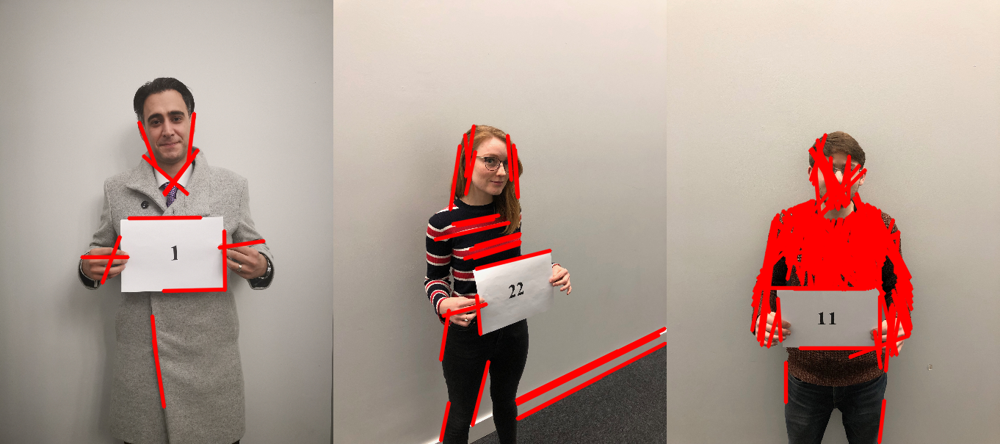

In [0]:
sp = seph.copy()
so = soph.copy()
jo = jack1.copy()
        
linesP = cv2.HoughLinesP(edges1, 1, np.pi / 180, 50, None, 50, 10)
#print(linesP)
if linesP is not None:
    for i in range(0, len(linesP)):
        l = linesP[i][0]
        cv2.line(sp, (l[0], l[1]), (l[2], l[3]), (0,0,255), 3, cv2.LINE_AA)
        
        
linesP = cv2.HoughLinesP(edges2, 1, np.pi / 180, 50, None, 50, 10)
#print(linesP)
if linesP is not None:
    for i in range(0, len(linesP)):
        l = linesP[i][0]
        cv2.line(so, (l[0], l[1]), (l[2], l[3]), (0,0,255), 3, cv2.LINE_AA)
        
linesP = cv2.HoughLinesP(edges3, 1, np.pi / 180, 50, None, 50, 10)
#print(linesP)
if linesP is not None:
    for i in range(0, len(linesP)):
        l = linesP[i][0]
        cv2.line(jo, (l[0], l[1]), (l[2], l[3]), (0,0,255), 3, cv2.LINE_AA)
        
lies = np.hstack((sp, so, jo))       
        
cv2_imshow(lies)

# Corners : Good Features To Track

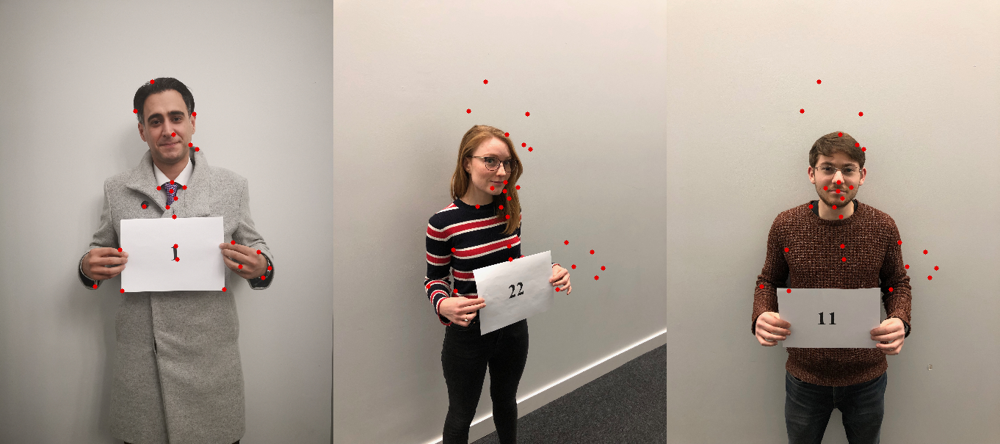

In [0]:
s1 = seph.copy()
s2 = soph.copy()
j1 = jack1.copy()

test1 = cv2.cvtColor(s1, cv2.COLOR_BGR2GRAY)
corners = cv2.goodFeaturesToTrack(test,25,0.01,10)
corners = np.int0(corners)

for i in corners:
    x,y = i.ravel()
    cv2.circle(s1,(x,y),3,(0,0,225),-1)
    
test2 = cv2.cvtColor(s2, cv2.COLOR_BGR2GRAY)
corners = cv2.goodFeaturesToTrack(test,25,0.01,10)
corners = np.int0(corners)

for i in corners:
    x,y = i.ravel()
    cv2.circle(s2,(x,y),3,(0,0,225),-1)
    
    
test3 = cv2.cvtColor(j1, cv2.COLOR_BGR2GRAY)
corners = cv2.goodFeaturesToTrack(test,25,0.01,10)
corners = np.int0(corners)

for i in corners:
    x,y = i.ravel()
    cv2.circle(j1,(x,y),3,(0,0,225),-1)
    
    
spots = np.hstack((s1, s2, j1))

cv2_imshow(spots)

# Blob Stuff

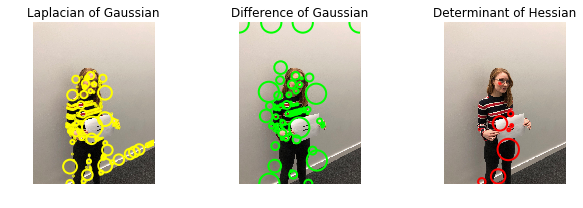

In [0]:
from math import sqrt
from skimage import data
from skimage.feature import blob_dog, blob_log, blob_doh
from skimage.color import rgb2gray
import matplotlib.pyplot as plt


image = cv2.cvtColor(soph,cv2.COLOR_BGR2RGB)
image_gray = rgb2gray(image)

#Laplacian of Gaussian
blobs_log = blob_log(image_gray, max_sigma=40, num_sigma=10, threshold=.1)
blobs_log[:, 2] = blobs_log[:, 2] * sqrt(2) # Compute radii in the 3rd column.

#Difference of Gaussian
blobs_dog = blob_dog(image_gray, max_sigma=40, threshold=.1)
blobs_dog[:, 2] = blobs_dog[:, 2] * sqrt(2)


#Determinant of Hessian
blobs_doh = blob_doh(image_gray, max_sigma=40, threshold=.01)

blobs_list = [blobs_log, blobs_dog, blobs_doh]

colors = ['yellow', 'lime', 'red']
titles = ['Laplacian of Gaussian', 'Difference of Gaussian', 'Determinant of Hessian']
sequence = zip(blobs_list, colors, titles)

fig, axes = plt.subplots(1, 3, figsize=(9, 3), sharex=True, sharey=True)
ax = axes.ravel()

for idx, (blobs, color, title) in enumerate(sequence):
    ax[idx].set_title(title)
    ax[idx].imshow(image, interpolation='nearest')
    for blob in blobs:
        y, x, r = blob
        c = plt.Circle((x, y), r, color=color, linewidth=2, fill=False)
        ax[idx].add_patch(c)
    ax[idx].set_axis_off()

plt.tight_layout()
plt.show()

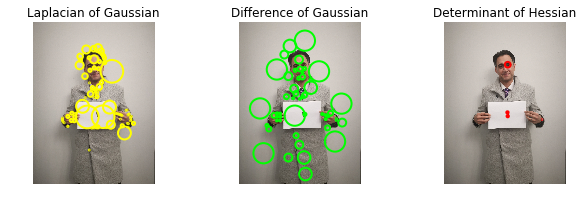

In [0]:
from math import sqrt
from skimage import data
from skimage.feature import blob_dog, blob_log, blob_doh
from skimage.color import rgb2gray
import matplotlib.pyplot as plt


image = cv2.cvtColor(seph,cv2.COLOR_BGR2RGB)
image_gray = rgb2gray(image)

#Laplacian of Gaussian
blobs_log = blob_log(image_gray, max_sigma=30, num_sigma=10, threshold=.1)
blobs_log[:, 2] = blobs_log[:, 2] * sqrt(2) # Compute radii in the 3rd column.

#Difference of Gaussian
blobs_dog = blob_dog(image_gray, max_sigma=30, threshold=.1)
blobs_dog[:, 2] = blobs_dog[:, 2] * sqrt(2)


#Determinant of Hessian
blobs_doh = blob_doh(image_gray, max_sigma=30, threshold=.01)

blobs_list = [blobs_log, blobs_dog, blobs_doh]

colors = ['yellow', 'lime', 'red']
titles = ['Laplacian of Gaussian', 'Difference of Gaussian', 'Determinant of Hessian']
sequence = zip(blobs_list, colors, titles)

fig, axes = plt.subplots(1, 3, figsize=(9, 3), sharex=True, sharey=True)
ax = axes.ravel()

for idx, (blobs, color, title) in enumerate(sequence):
    ax[idx].set_title(title)
    ax[idx].imshow(image, interpolation='nearest')
    for blob in blobs:
        y, x, r = blob
        c = plt.Circle((x, y), r, color=color, linewidth=2, fill=False)
        ax[idx].add_patch(c)
    ax[idx].set_axis_off()

plt.tight_layout()
plt.show()